In [82]:
import EddyDetectionV2 as eddy
import oceanspy as ospy
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmocean.cm as cmo
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.colors import Normalize
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.colors import SymLogNorm
from tqdm import tqdm
import ast
from matplotlib.animation import FuncAnimation, FFMpegFileWriter
from matplotlib.colors import LinearSegmentedColormap
import pandas as pd

# Set default font size to match LaTeX document
plt.rcParams.update({
    'font.size': 11,       # Default text size
    'axes.titlesize': 10,  # Title size
    'axes.labelsize': 10,  # Axis label size
    'xtick.labelsize': 8, # X-tick label size
    'ytick.labelsize': 8, # Y-tick label size
    'legend.fontsize': 8, # Legend font size
    'figure.titlesize': 12 # Figure title size
})

In [83]:
dfOWsurf = xr.open_dataset('/nird/projects/NS9608K/MSc_EK/Data/Eddies_fullYear.nc')['EddyDetection']

In [84]:
FWC = xr.open_dataset(r'/nird/projects/NS9608K/MSc_EK/Data/FWC_full_domain.nc')['__xarray_dataarray_variable__'].sel(Y=slice(70,75)).sel(X=slice(-22,2))
FWC = FWC.resample(time='D').mean(dim='time')

In [85]:
locMax_surf = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/EddyResults/Tracking/locMAX_test.csv')
locMin_surf = pd.read_csv('/nird/projects/NS9608K/MSc_EK/Data/EddyResults/Tracking/locMin_test.csv')


In [86]:
display(locMax_surf)
IDs = [X[1] for X in locMax_surf.values]
print(IDs)

,Time,ID,Latitude,Longitude
0,0,['1'],71.079446,-9.051356
1,0,['2'],71.241831,-14.804034
2,0,['3'],71.278327,-10.910303
3,0,['4'],71.370250,-2.622462
4,0,['5'],71.444517,-8.921229
...,...,...,...,...
12422,364,['3140'],72.949224,-6.374665
12423,364,['3170'],73.281687,-17.847658
12424,364,['3156'],73.330735,-15.751358
12425,364,['3196'],73.430090,-12.556844


["['1']", "['2']", "['3']", "['4']", "['5']", "['6']", "['7']", "['8']", "['9']", "['10']", "['11']", "['12']", "['13']", "['14']", "['15']", "['16']", "['17']", "['18']", "['19']", "['20']", "['21']", "['22']", "['23']", "['24']", "['25']", "['26']", "['27']", "['28']", "['1']", "['29']", "['2']", "['5']", "['6']", "['8']", "['4']", "['9']", "['12']", "['13']", "['30']", "['16']", "['17']", "['18']", "['19']", "['20']", "['21']", "['23']", "['31']", "['32']", "['33']", "['34']", "['26']", "['35']", "['36']", "['37']", "['1']", "['38']", "['2']", "['3']", "['39']", "['5']", "['6']", "['8']", "['9']", "['12']", "['40']", "['17']", "['41']", "['30']", "['18']", "['19']", "['20']", "['23']", "['42']", "['43']", "['32']", "['44']", "['33']", "['27']", "['26']", "['36']", "['35']", "['37']", "['46']", "['13']", "['50']", "['45']", "['1']", "['42']", "['18']", "['47']", "['23']", "['27']", "['43']", "['4']", "['3']", "['5']", "['8']", "['12']", "['30']", "['26']", "['48']", "['20']", "['37']

In [87]:
display(len(np.unique(locMax_surf['Time'].values)),np.unique(locMax_surf['Time'].values))
display(locMax_surf[6550:6600])

365

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

,Time,ID,Latitude,Longitude
6550,184,['1856'],71.079446,-13.959468
6551,184,['1821'],71.097344,-15.253122
6552,184,"['1324bb', '1324ab']",72.677913,-8.399612
6553,184,['1848'],71.314977,-16.809849
6554,184,['1542ba'],71.614118,-7.172973
6555,184,['1853'],72.004763,-1.935963
6556,184,['1667'],72.481718,-6.463825
6557,184,['1849'],71.370250,-16.254561
6558,184,['1627'],71.500658,-3.721808
6559,184,"['1227baa', '1227caa']",71.351786,-11.775288


In [88]:
def convert_to_list(input_string):
    try:
        data = ast.literal_eval(input_string)
        data = [int(X) for X in data]
        return data
    except (ValueError, SyntaxError):
        return [input_string]
    

ID = locMin_surf['ID'].values
ID_min = [convert_to_list(ids) if isinstance(ids, str) else [(int(ids))] for ids in ID]

ID = locMax_surf['ID'].values
ID_max = [convert_to_list(ids) if isinstance(ids, str) else [(int(ids))] for ids in ID]
IDs_not_int = [X if isinstance(X[0],str) else None for X in ID_max]
for i in IDs_not_int:
    if i is not None:
        print(i)

["['17a']"]
["['17b']"]
["['13a']"]
["['13b']"]
["['13a']"]
["['5a']"]
["['5b']"]
["['13b']"]
["['5a']"]
["['46a']"]
["['46b']"]
["['5ba']"]
["['5bb']"]
["['12a']"]
["['12b']"]
["['13b']"]
["['5a']"]
["['5ba', '5bb']"]
["['12a', '12b']"]
["['5a']"]
["['5ba', '5bb']"]
["['12a', '12b']"]
["['13b']"]
["['5ba', '5bb']"]
["['12a', '12b']"]
["['13b']"]
["['5a']"]
["['102a']"]
["['102b']"]
["['5ba', '5bb']"]
["['12a', '12b']"]
["['13b']"]
["['6a']"]
["['6b']"]
["['6b']"]
["['5ba', '5bb']"]
["['12aa', '12ba']"]
["['12ab', '12bb']"]
["['102b', '102a']"]
["['13b']"]
["['12ba', '12aa']"]
["['6b']"]
["['5ba', '5bb']"]
["['102b', '102a']"]
["['12bb', '12ab']"]
["['13ba']"]
["['13bb']"]
["['5ba', '5bb']"]
["['6b']"]
["['12ba', '12aa']"]
["['13ba', '13bb']"]
["['12ba', '12aa']"]
["['13ba', '13bb']"]
["['6b']"]
["['5baa', '5bba']"]
["['5bab', '5bbb']"]
["['102b', '102a']"]
["['6b']"]
["['5baa', '5bba']"]
["['12ba', '12aa']"]
["['13ba', '13bb']"]
["['102b', '102a']"]
["['5baa', '5bba']"]
["['12ba', '12

In [89]:
#ID_min_ = np.max([np.max(X) for X in ID_min])
#steps = np.arange(np.max(ID_min_))

eddies_ID_max_t_surf = locMax_surf.set_index(['Time'])
eddies_ID_min_t_surf = locMin_surf.set_index(['Time'])

In [90]:

Days_pos_surf = [[] for i in steps]
for ID,LAT,LON,TIME in zip(locMax_surf['ID'],locMax_surf['Latitude'],locMax_surf['Longitude'],locMax_surf['Time']):
    Days_pos_surf[int(ID)-1].append([LON,LAT,TIME])
for ID,LAT,LON,TIME in zip(locMin_surf['ID'],locMin_surf['Latitude'],locMin_surf['Longitude'],locMin_surf['Time']):
    Days_pos_surf[int(ID)-1].append([LON,LAT,TIME])




ValueError: invalid literal for int() with base 10: "['1']"

/tmp/ipykernel_3720747/2686290570.py:33: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_3720747/2686290570.py:61: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed in 3.10.
  for collection in contour.collections:
/tmp/ipykernel_3720747/2686290570.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(


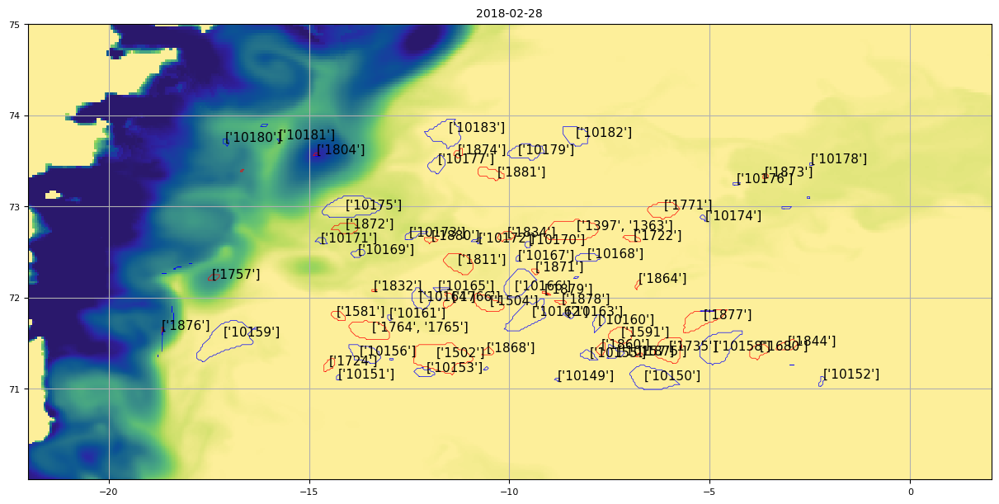

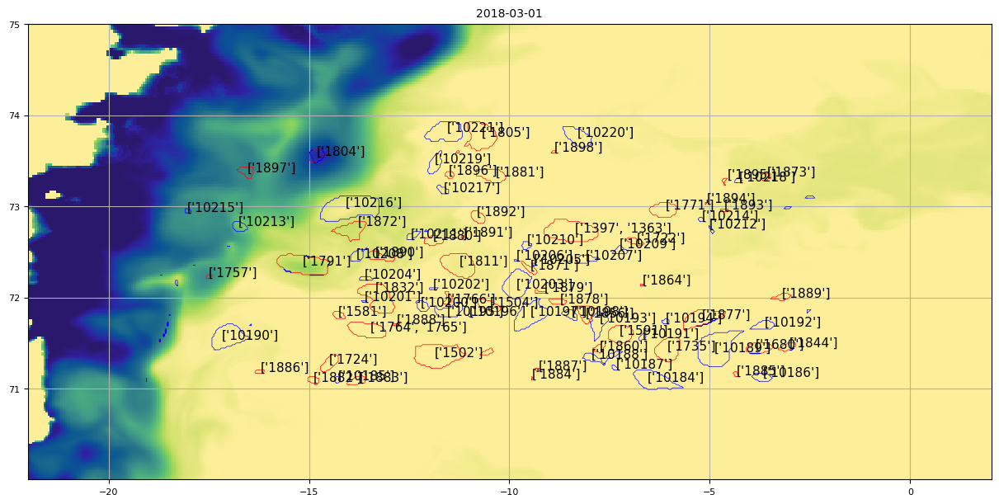

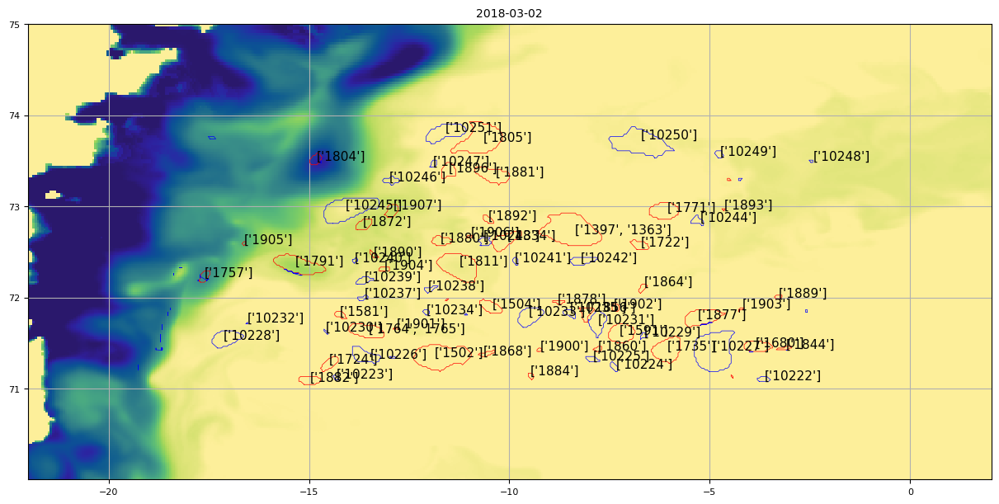

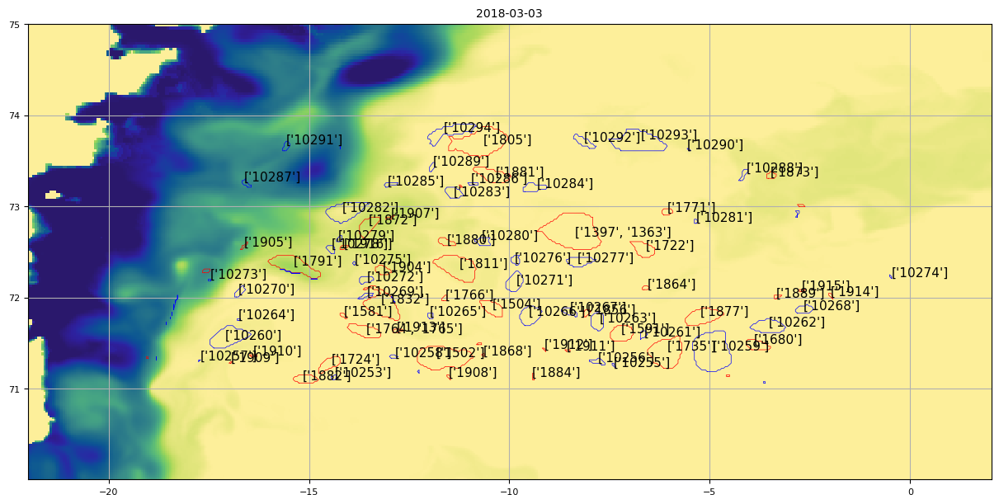

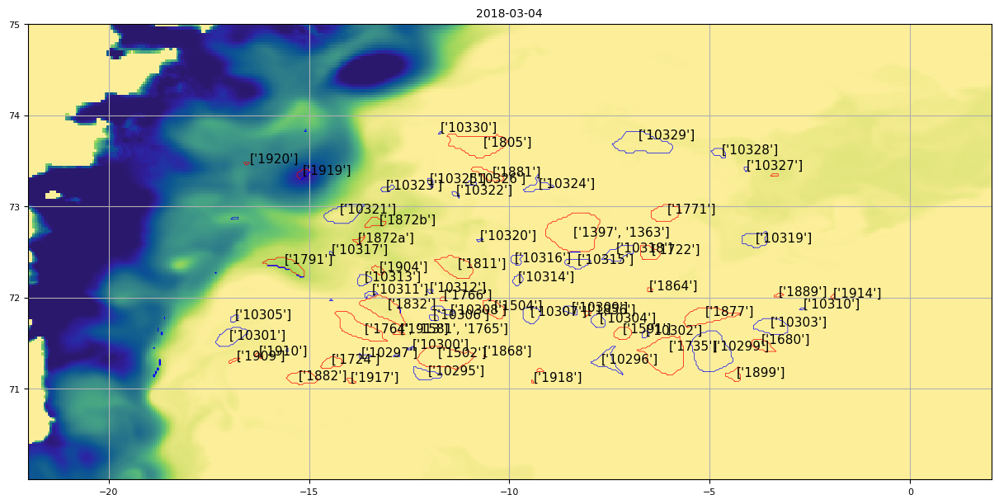

...

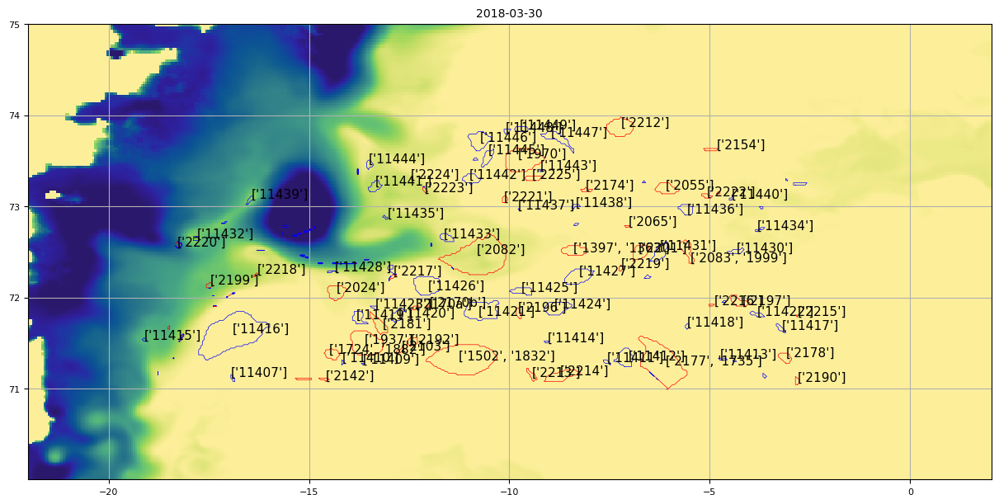

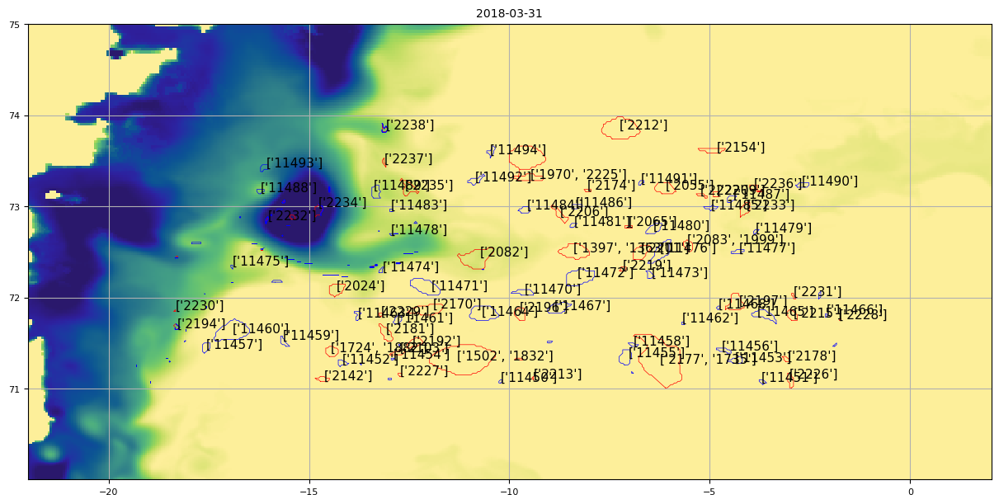

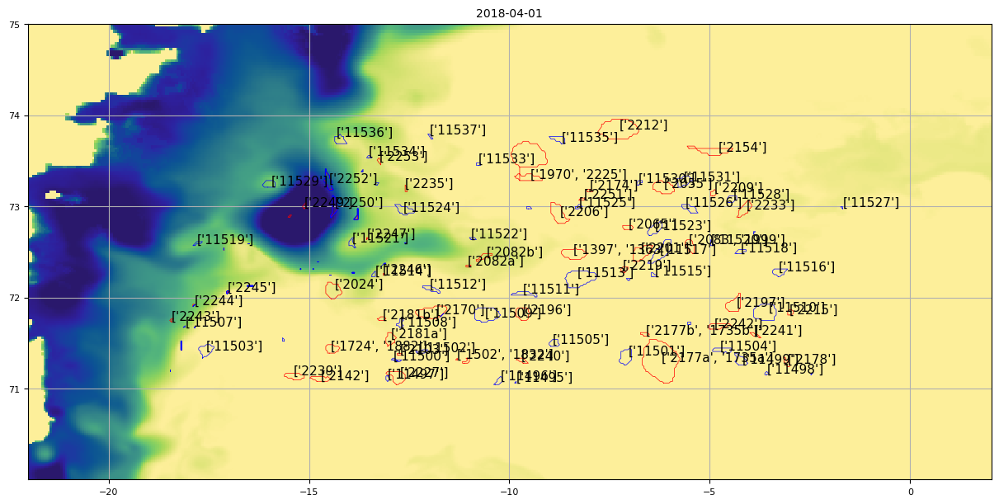

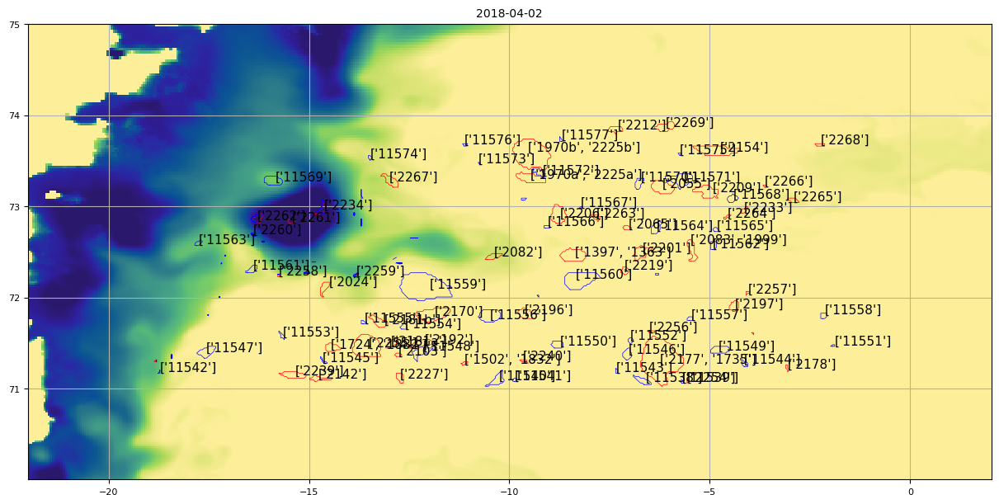

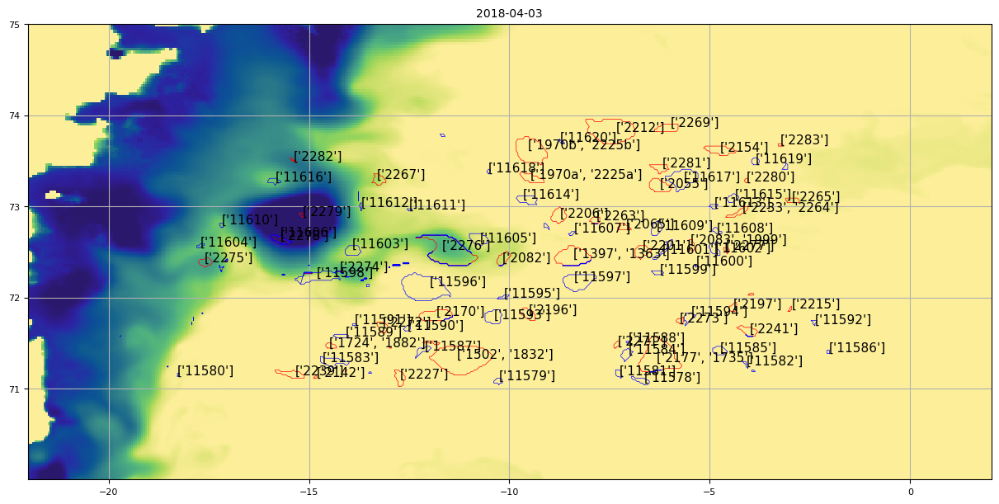

In [81]:
def is_closed_contour(vertices, tol=1e-5):
                distance = np.linalg.norm(vertices[0] - vertices[-1])
                return distance < tol


# Process Contour Paths to Handle Jumps
def process_contour_path(vertices, jump_threshold=0.2):
    segments = []
    current_segment = [vertices[0]]
    
    for i in range(1, len(vertices)):
        if np.linalg.norm(vertices[i] - vertices[i-1]) > jump_threshold:
            segments.append(np.array(current_segment))
            current_segment = [vertices[i]]
        else:
            current_segment.append(vertices[i])
    
    if current_segment:
        segments.append(np.array(current_segment))
    
    return segments


time_ = np.arange(180,215)
for time in time_:
    fig, ax = plt.subplots(
        figsize=(12,6),layout='constrained'
    )
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[0,1],colors='white')
    ax.grid()
    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'r-', linewidth=0.5)


    data_ID = eddies_ID_max_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_max_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_max_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(data_ID[i]),[data_LON[i],data_LAT[i]])
    
    contour = ax.contourf(dfOWsurf.X,dfOWsurf.Y,dfOWsurf[time],[1.5,2],colors='white')

    all_contour_points = []

    for collection in contour.collections:
        for path in collection.get_paths():
            # Collect the vertices of the path
            vertices = path.vertices
            all_contour_points.append(vertices)

    processed_contour_segments = []
    for vertices in all_contour_points:
        segments = process_contour_path(vertices)
        processed_contour_segments.extend(segments)
    
    for vertices in processed_contour_segments:
        ax.plot(vertices[:, 0], vertices[:, 1], 'b-', linewidth=0.5)

    data_ID = eddies_ID_min_t_surf.at[time,'ID'].values
    data_LON = eddies_ID_min_t_surf.at[time,'Longitude'].values
    data_LAT = eddies_ID_min_t_surf.at[time,'Latitude'].values
    for i in range(len(data_ID)):
        for vertices in processed_contour_segments:
            region = Path(vertices)
            if region.contains_point((data_LON[i],data_LAT[i])):
                ax.annotate(str(data_ID[i]),[data_LON[i],data_LAT[i]])
    
    ax.pcolormesh(FWC.X,FWC.Y,FWC[time],cmap=cmo.haline_r,vmin=0,vmax=10)
    ax.set_title(str(FWC.time.values[time])[0:10])

In [111]:
eddy_ID_area = xr.open_dataset('/nird/projects/NS9608K/MSc_EK/Data/EddyResults/Tracking/EddyAreaID.nc')

In [115]:
np.unique(eddy_ID_area['EddyID'].isel(time=2).values)

array(['0', "['1']", "['11']", "['12']", "['140']", "['141']", "['142']",
       "['143']", "['144']", "['145']", "['146']", "['147']", "['148']",
       "['149']", "['15']", "['150']", "['151']", "['152']", "['153']",
       "['154']", "['155']", "['156']", "['157']", "['158']", "['159']",
       "['16', '13']", "['160']", "['161']", "['162']", "['163']",
       "['164']", "['165']", "['166']", "['167']", "['168']", "['169']",
       "['17']", "['170']", "['171']", "['172']", "['173']", "['18']",
       "['2']", "['22']", "['23']", "['25']", "['26']", "['27']",
       "['29']", "['34']", "['35a']", "['35b']", "['37']", "['4']",
       "['40']", "['43']", "['45']", "['46']", "['49']", "['5']",
       "['50']", "['51']", "['52']", "['56']", "['57']", "['58']",
       "['59']", "['6']", "['9']"], dtype=object)